In [23]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

import pandas as pd
import os

#### Load Data

We are going to load in the data that is stored as csv

In [24]:
# List of local file paths
file_paths = [
    "../data/processed/Buffalo_newtix.csv",
    "../data/processed/Boston_newtix.csv",
    "../data/processed/Miami_newtix.csv",
    "../data/processed/Oakland_newtix.csv",
    "../data/processed/Washington_newtix.csv"
]

# List to store each DataFrame
dataframes = []

# Loop over each file and load into a DataFrame
for file_path in file_paths:
    try:
        # Load the content into a DataFrame
        df = pd.read_csv(file_path)
        
        # Extract city name from the file path
        city_name = file_path.split("/")[-1].split("_")[0].capitalize()  # Capitalize city name

        # Add a new column for the city name
        df["city"] = city_name

        # Append the DataFrame to the list
        dataframes.append(df)
        
    except Exception as e:
        print(f"Failed to process the file '{file_path}': {e}")

# Concatenate all DataFrames into one
merged_df = pd.concat(dataframes)

merged_df.reset_index(drop=True, inplace=True)


# Preview the merged DataFrame
print("Merged DataFrame Preview:")
print(merged_df.head())



Merged DataFrame Preview:
   year_week                           department  count     city
0     201401                      Dept of Parking   47.0  Buffalo
1     201401                 Dept of Public Works  358.0  Buffalo
2     201401                                 DPIS   88.0  Buffalo
3     201401                            Utilities   25.0  Buffalo
4     201401  Buffalo Municipal Housing Authority    5.0  Buffalo


In [25]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

110 unique combinations of city and department


### Exploring the seasonality of city level data

At the city level, the magnitude of the seasonality plots is generally less than the magnitude of the trends and residuals plots, indicating that seasonality may not be a big factor.

Miami, Oakland, and Boston all seem to have a constantly increasing number of tickets, which they don't tend to mark closed (this may be a data collection/process issue), so it is not surprising that any seasonal trends are lost in the noise.

Buffalo and Washington show more fluctuation as they open and close tickets, and the magnitude of Buffalo's seasonality is closer to that of the trends and residuals.

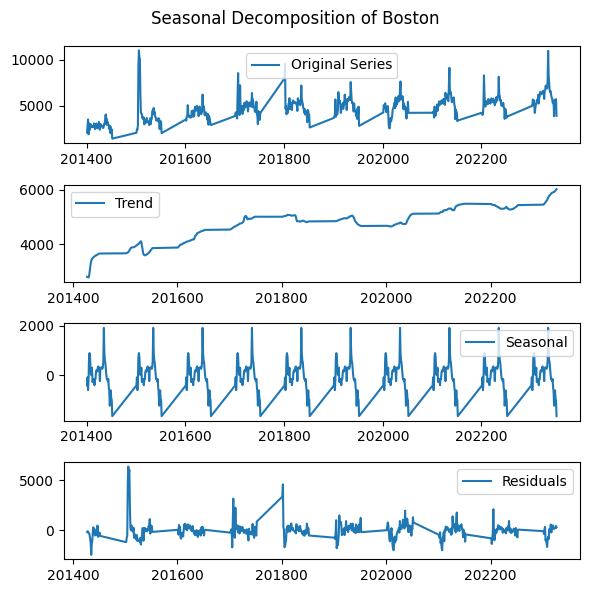

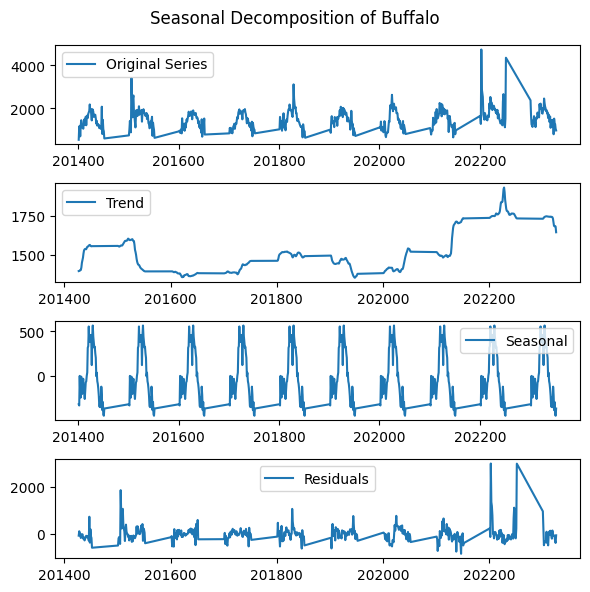

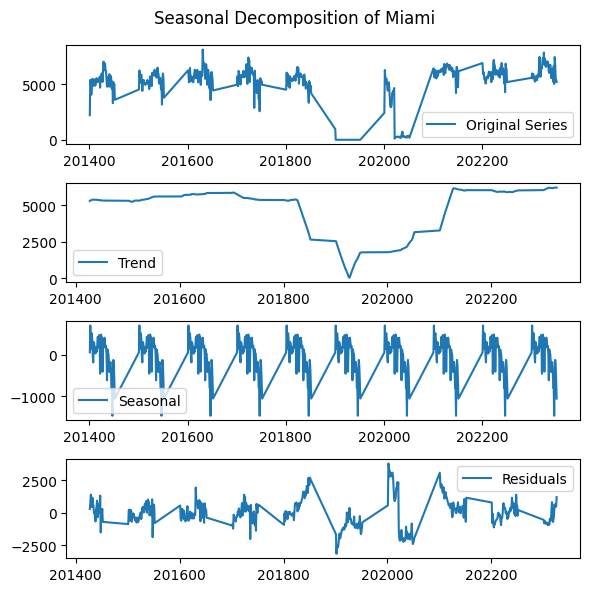

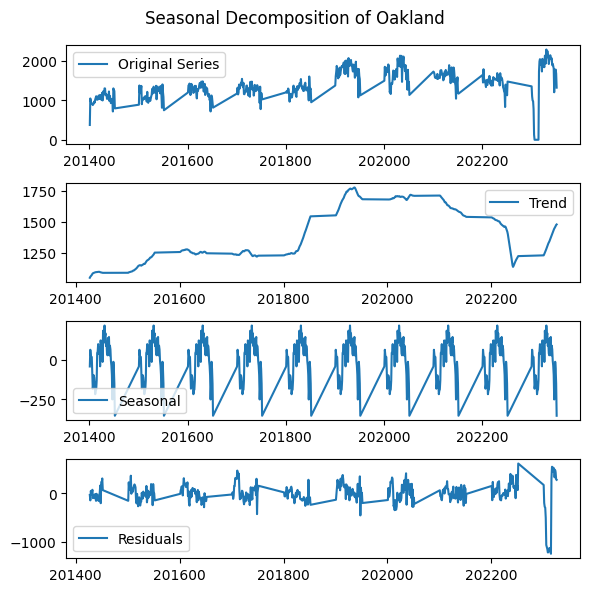

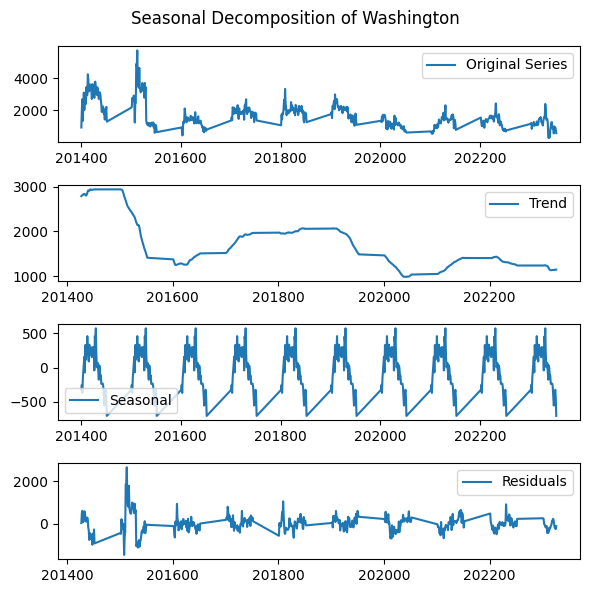

In [26]:
for city, city_df in merged_df.groupby("city"):
    # Perform seasonal decomposition on city level summary data
    df = city_df.groupby("year_week")["count"].sum().reset_index()
    df.set_index("year_week", inplace=True)
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {city}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


### Buffalo Seasonality Plots by Department

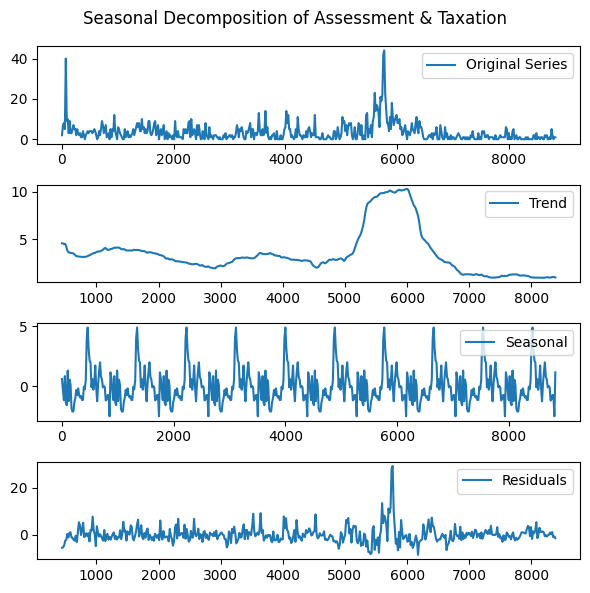

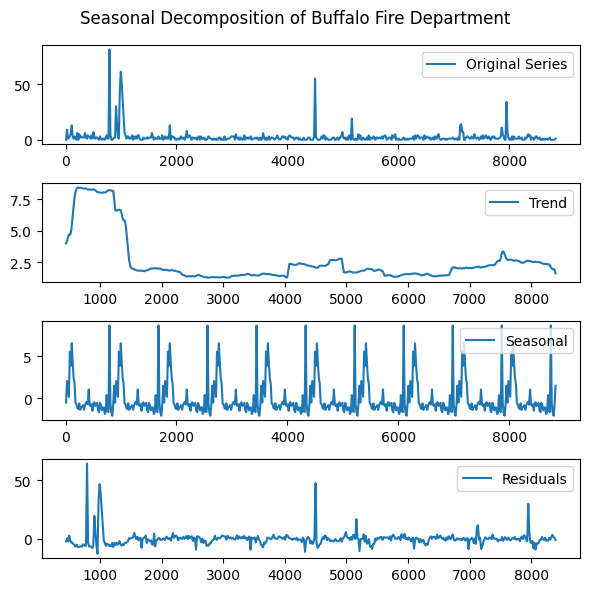

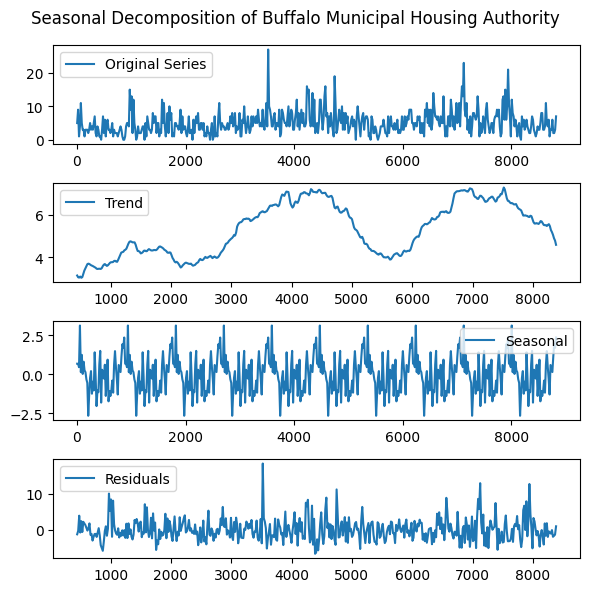

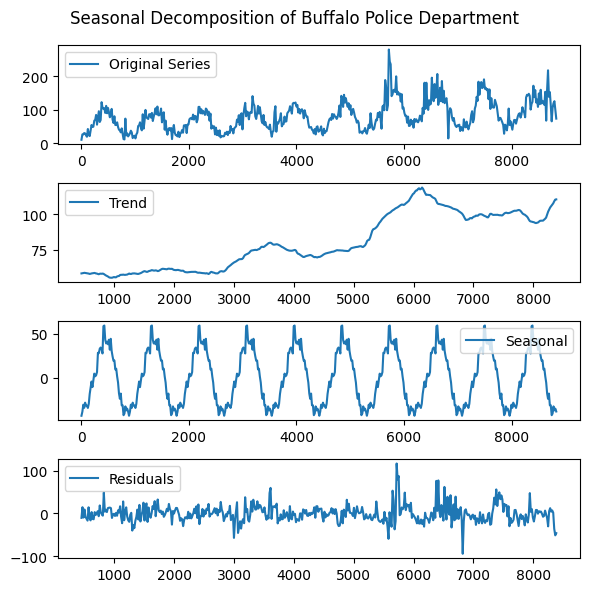

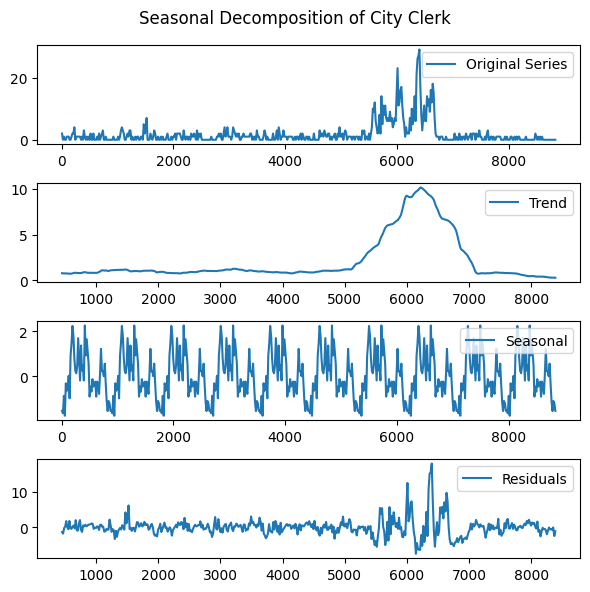

...

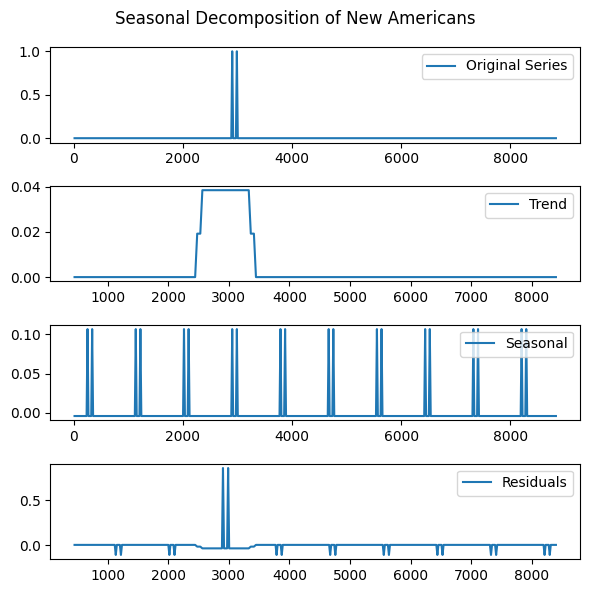

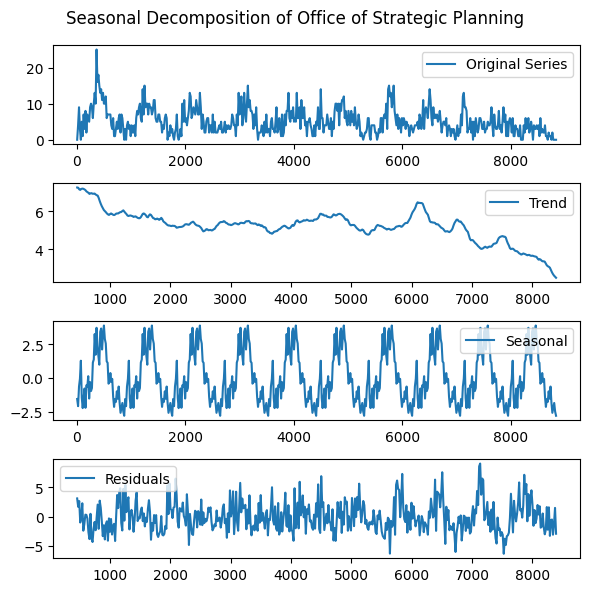

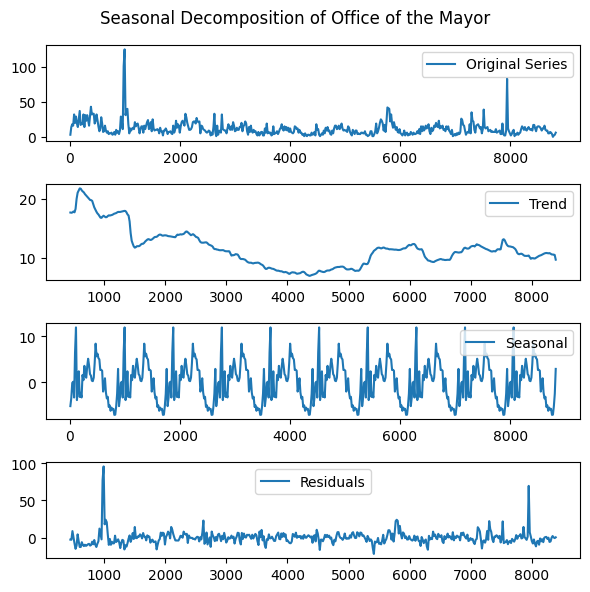

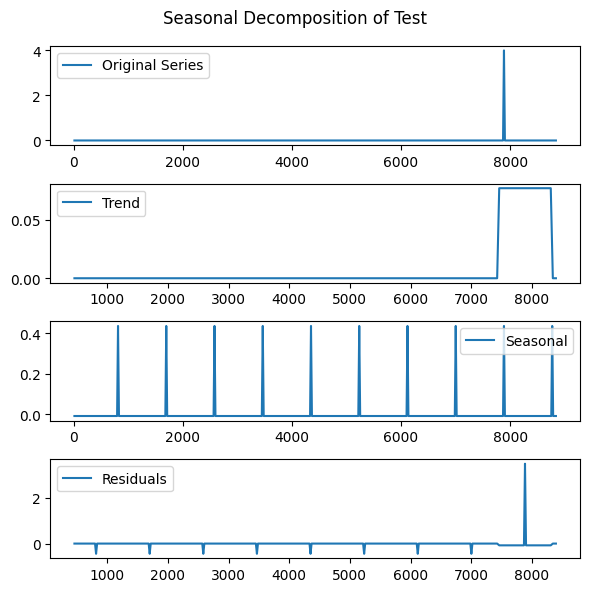

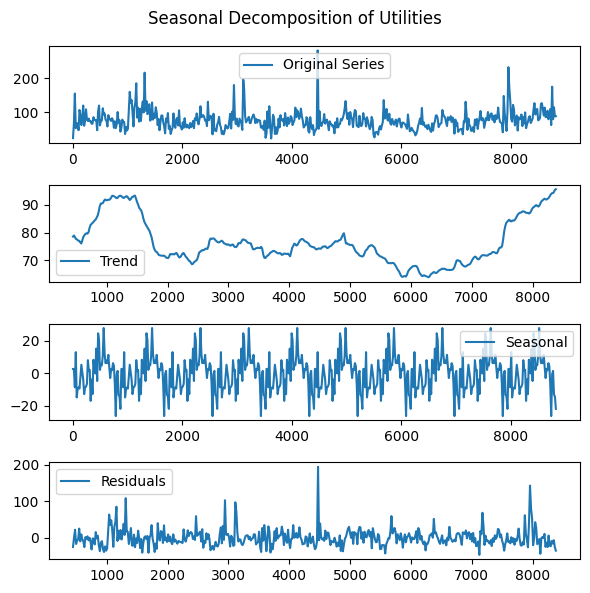

In [27]:
buffalo = merged_df[merged_df['city'] == 'Buffalo']
for dept, df in buffalo.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### Determining which departments to drop

In [28]:
buffalo.groupby('department')['count'].median().sort_values()

department
Community Services & Rec. Program.       0.0
Test                                     0.0
New Americans                            0.0
Human Resources                          0.0
Management Information Systems           0.0
Buffalo Fire Department                  1.0
City Clerk                               1.0
Assessment & Taxation                    2.0
Buffalo Municipal Housing Authority      5.0
Office of Strategic Planning             5.0
Dept of Law                              5.0
Office of the Mayor                     10.0
Utilities                               75.0
Buffalo Police Department               75.5
Dept of Parking                         92.0
DPIS                                   214.0
Dept of Public Works                   976.0
Name: count, dtype: float64

Dropping those with very few and infrequent requests.

In [29]:
drop_depts = ['Human Resources','Test','New Americans', 'Management Information Systems','Community Services & Rec. Program.']

merged_df.drop(merged_df.index[(merged_df['city']=='Buffalo')&(merged_df['department'].isin(drop_depts))],inplace=True)

#### Miami Seasonality Plots by department

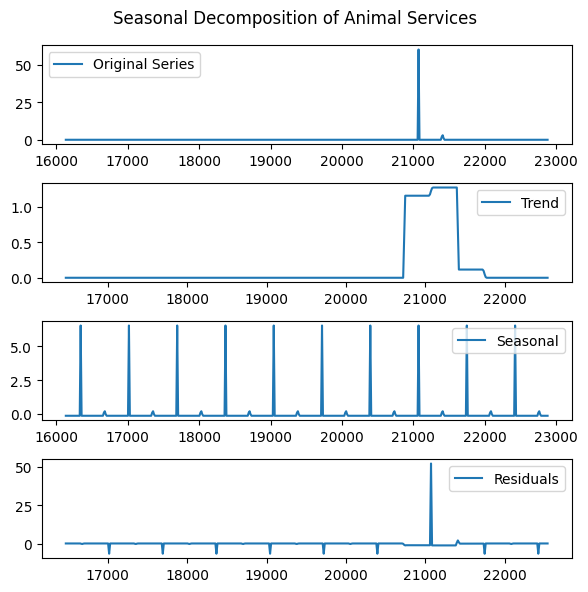

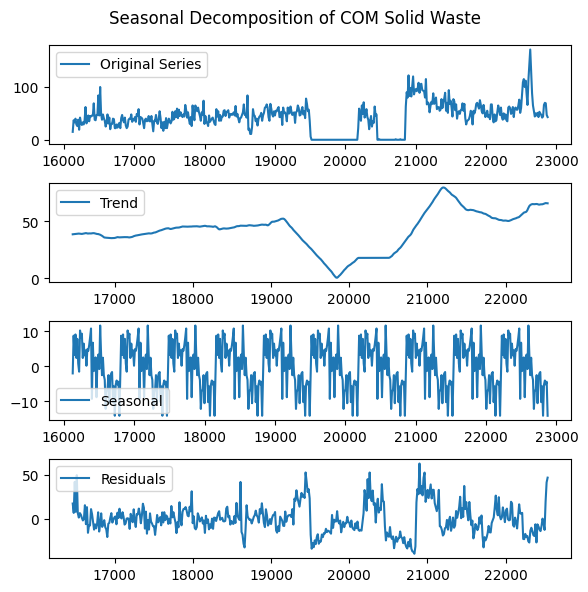

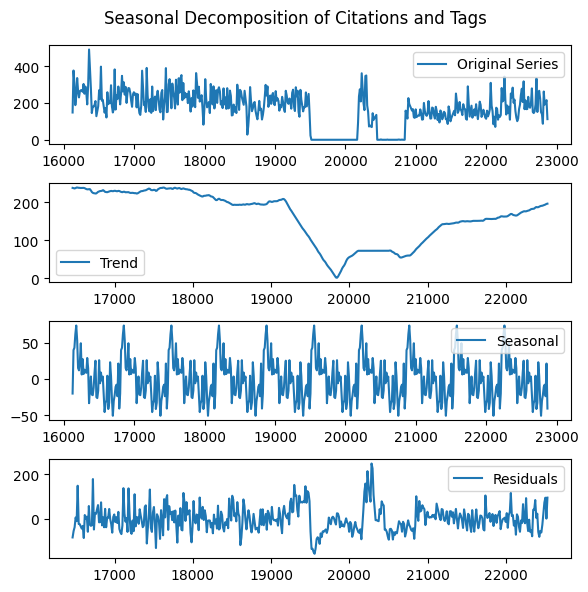

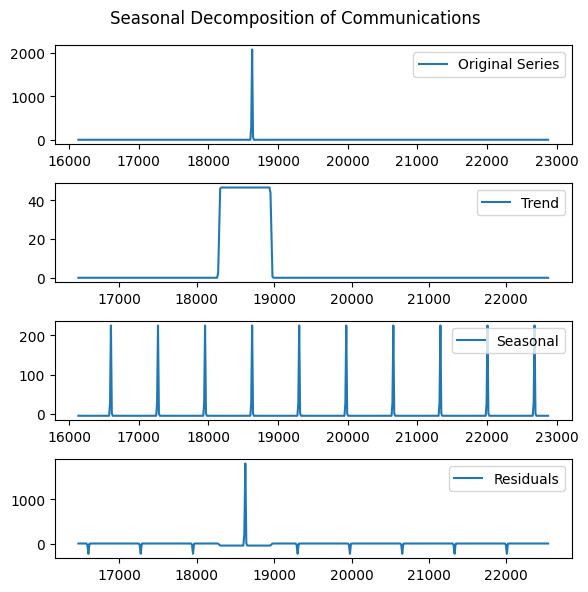

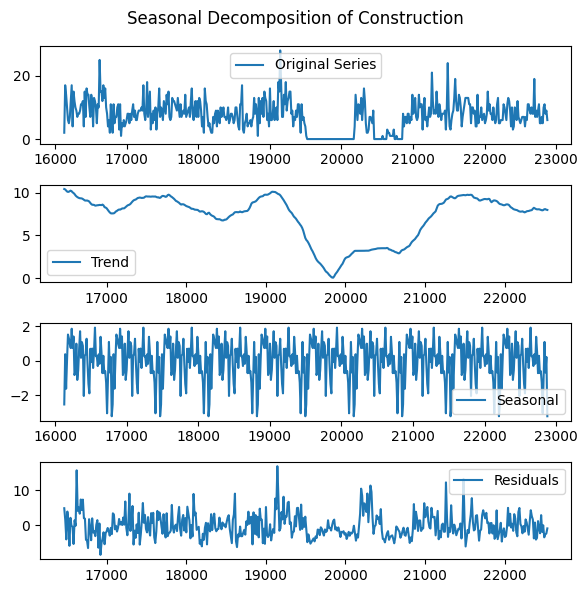

...

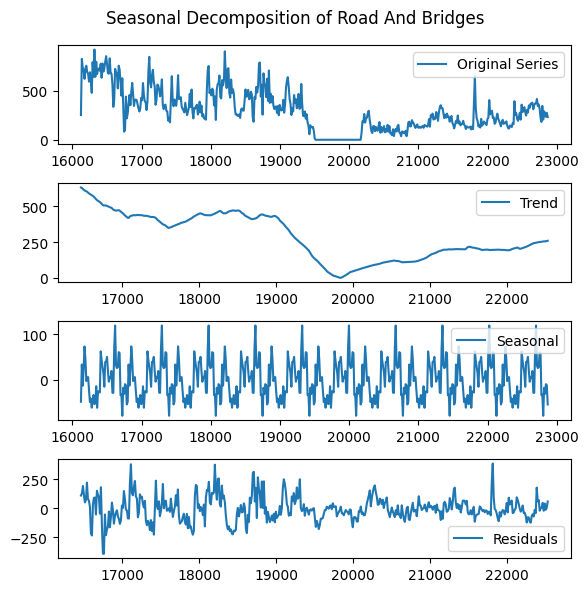

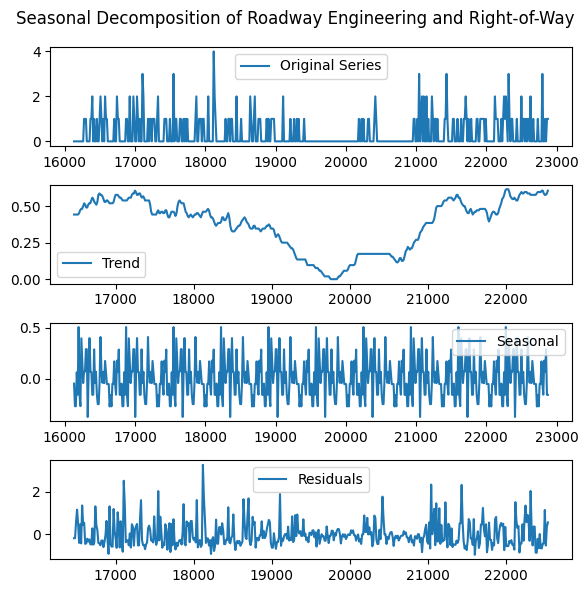

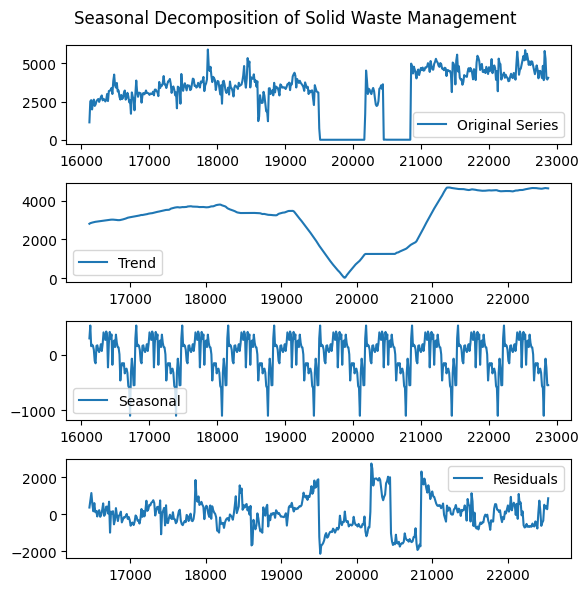

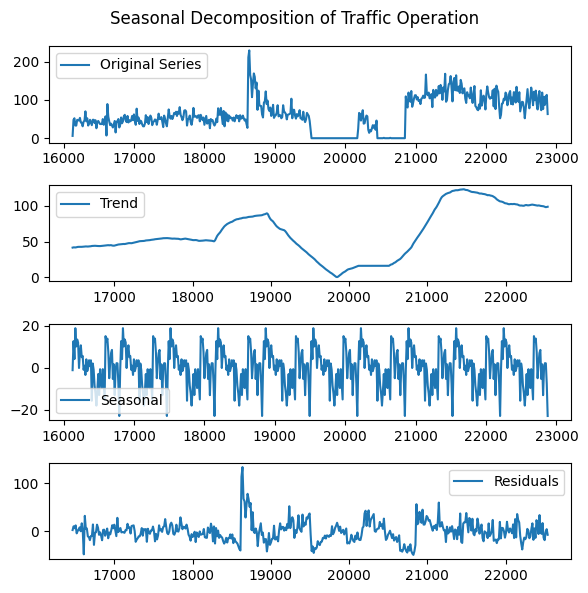

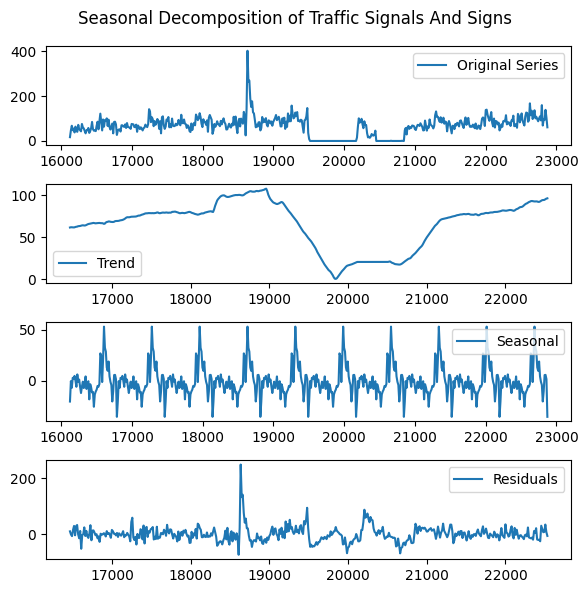

In [30]:
mia = merged_df[merged_df['city'] == 'Miami']
for dept, df in mia.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [31]:
mia.groupby('department')['count'].median().sort_values()

department
Animal Services                            0.0
Communications                             0.0
Roadway Engineering and Right-of-Way       0.0
Construction                               7.0
COM Solid Waste                           44.0
Traffic Operation                         57.0
Traffic Signals And Signs                 70.0
RAAM                                     108.0
Citations and Tags                       173.5
Road And Bridges                         270.5
Regulatory and Economic Resources        368.0
Enforcement Section                      514.0
Solid Waste Management                  3477.5
Name: count, dtype: float64

Dropping those with very few or infrequent requests, and also communications, which appears to have been all dumped into the system at once.

In [32]:
drop_depts = ['Communications','Roadway Engineering and Right-of-Way','Animal Services']
merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Miami')&(merged_df['department'].isin(drop_depts))])

### Boston Seasonality Plots by Department

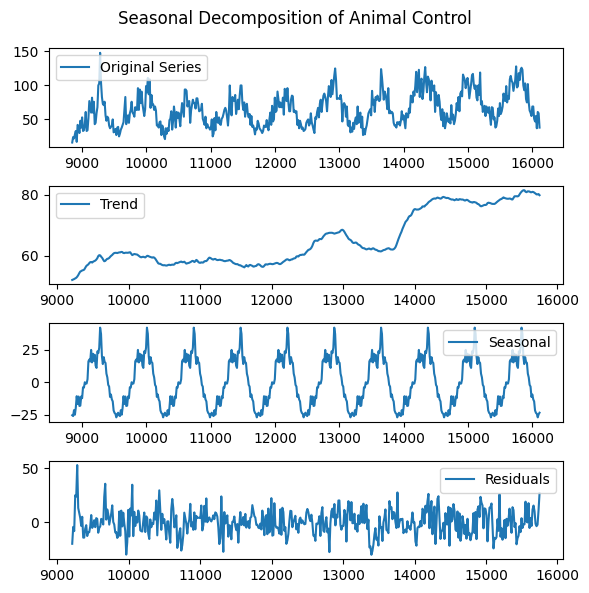

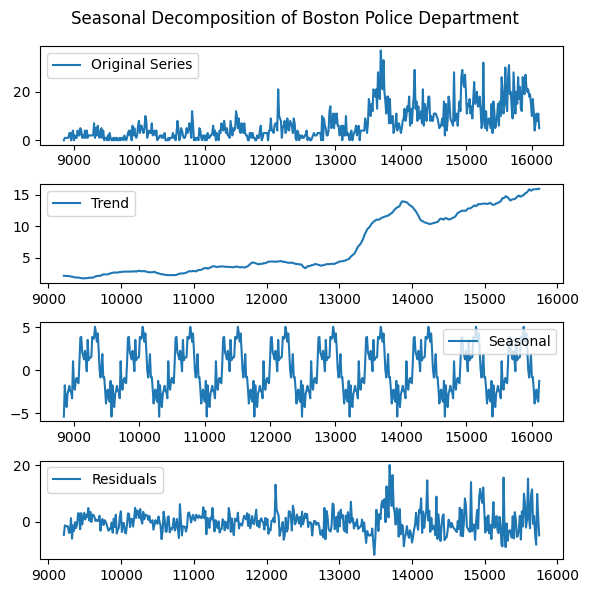

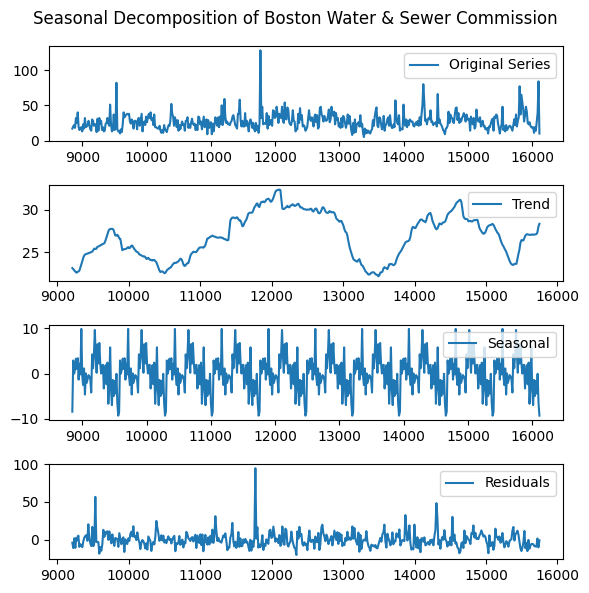

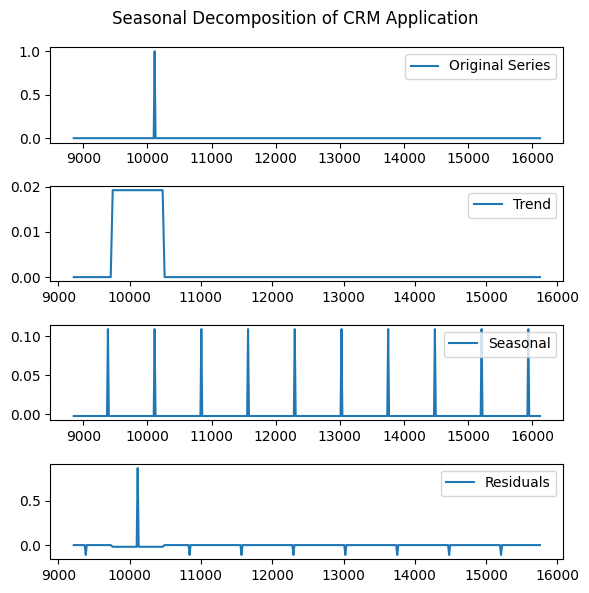

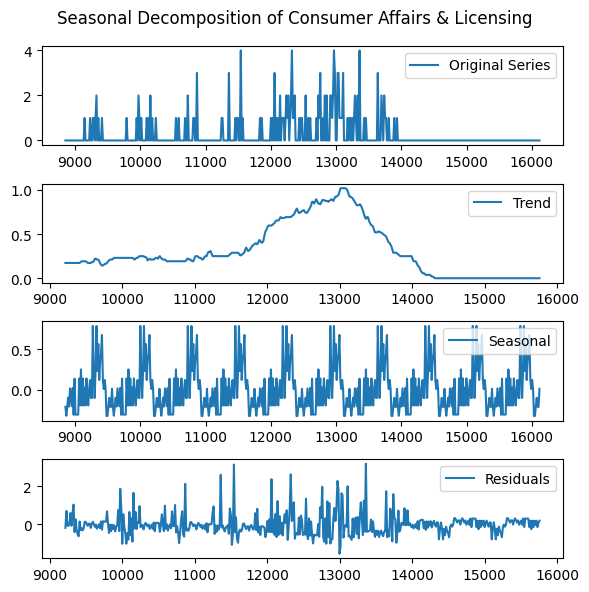

...

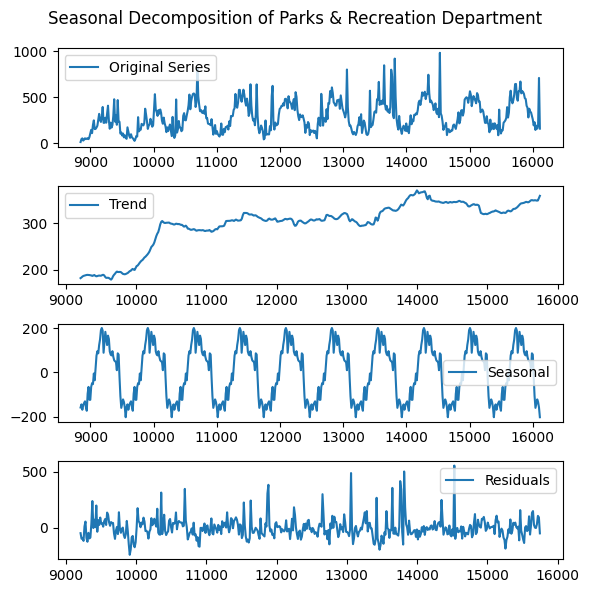

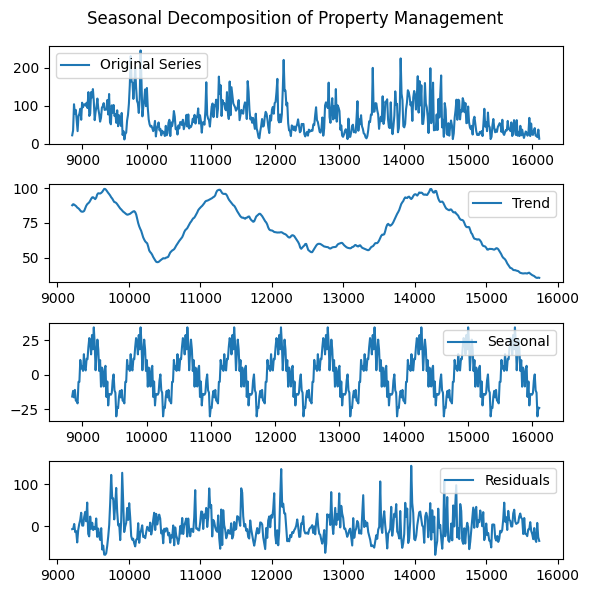

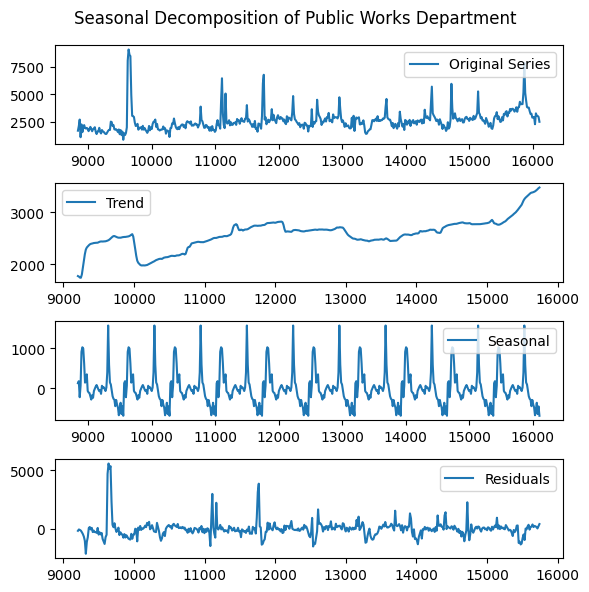

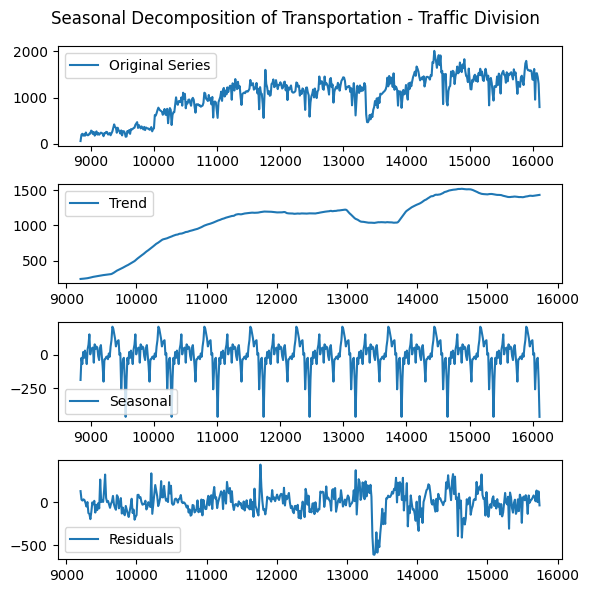

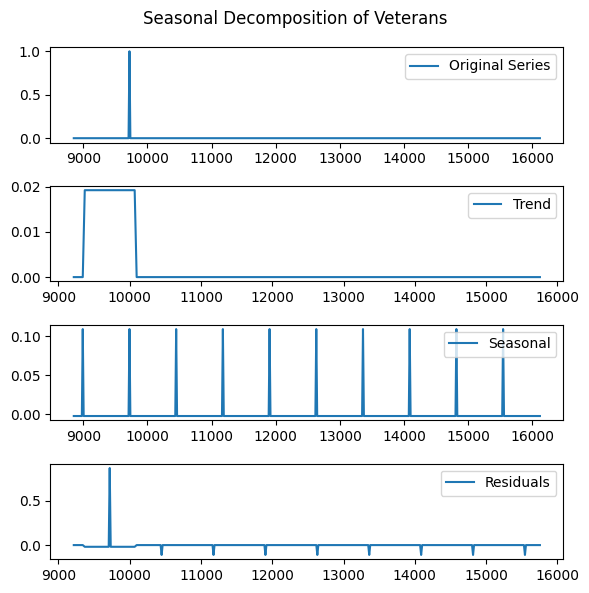

In [33]:
bos = merged_df[merged_df['city'] == 'Boston']
for dept, df in bos.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [34]:
bos.groupby('department')['count'].median().sort_values()

department
CRM Application                         0.0
Consumer Affairs & Licensing            0.0
Disability Department                   0.0
Neighborhood Services                   0.0
Veterans                                0.0
Boston Police Department                5.0
Boston Water & Sewer Commission        25.0
Animal Control                         62.0
Property Management                    62.0
Mayor's 24 Hour Hotline               191.5
Parks & Recreation Department         270.5
Inspectional Services                 400.0
Transportation - Traffic Division    1149.5
Public Works Department              2480.5
Name: count, dtype: float64

Dropping those with very few or infrequent requests, and disability department which hasn't been used in years. Consumer Affairs and licensing does not appear to have any recent new requests and has remained static.

In [35]:
drop_depts = ['Disability Department','Neighborhood Services','Consumer Affairs & Licensing','Veterans','CRM Application']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Boston')&(merged_df['department'].isin(drop_depts))])

### Oakland Seasonality plots by department

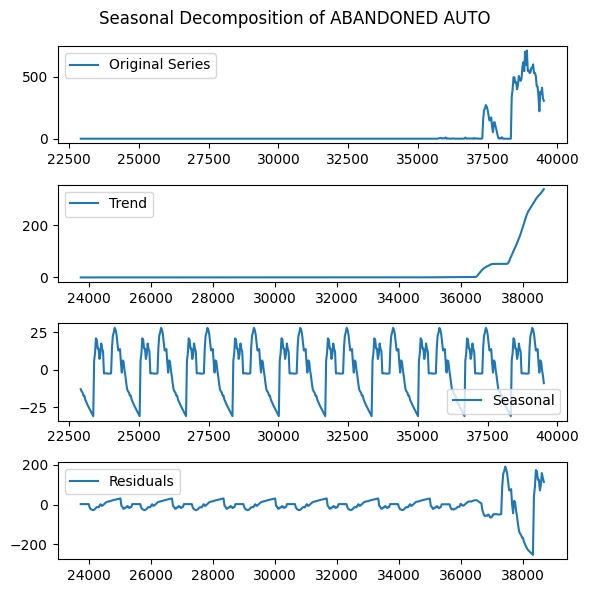

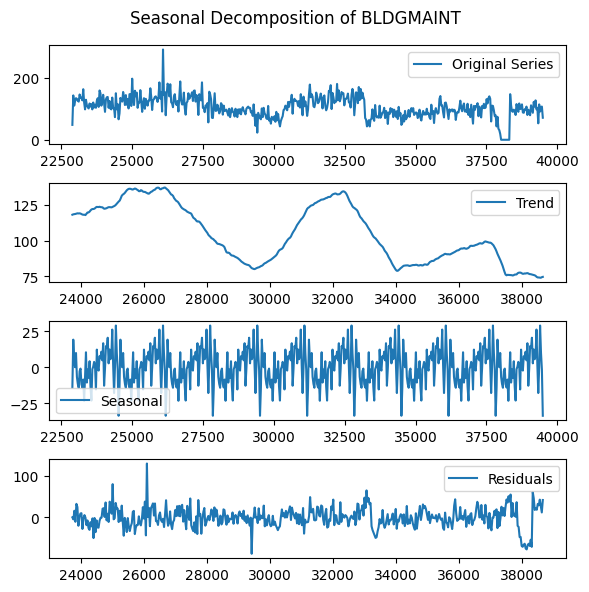

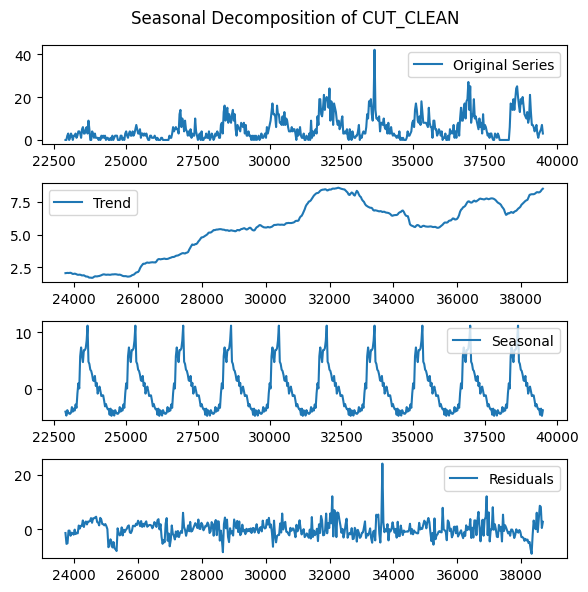

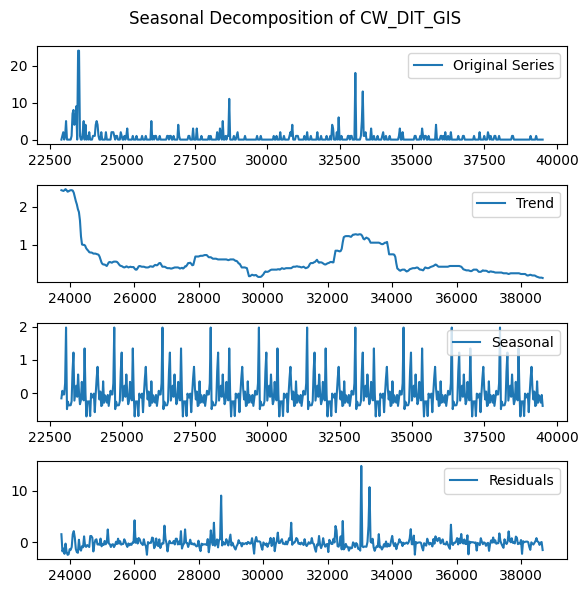

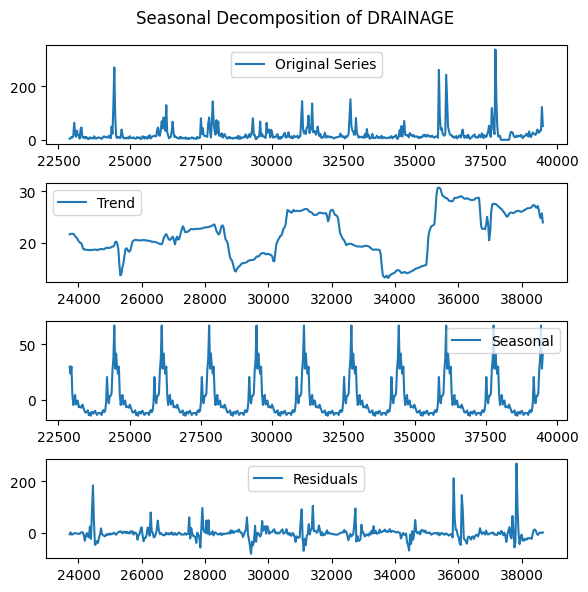

...

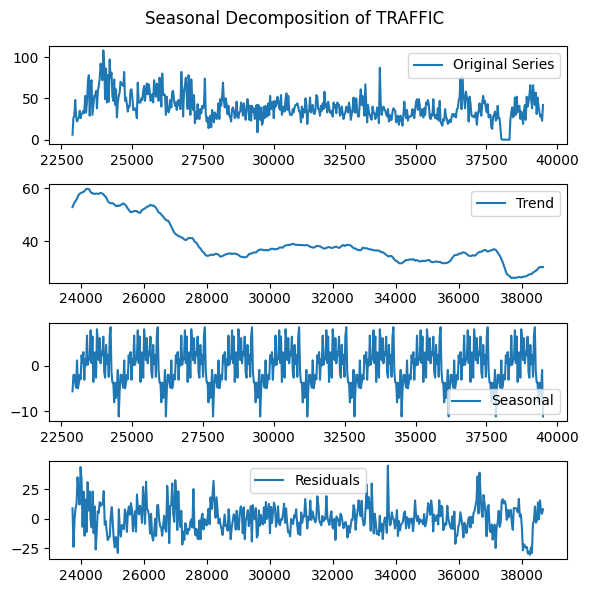

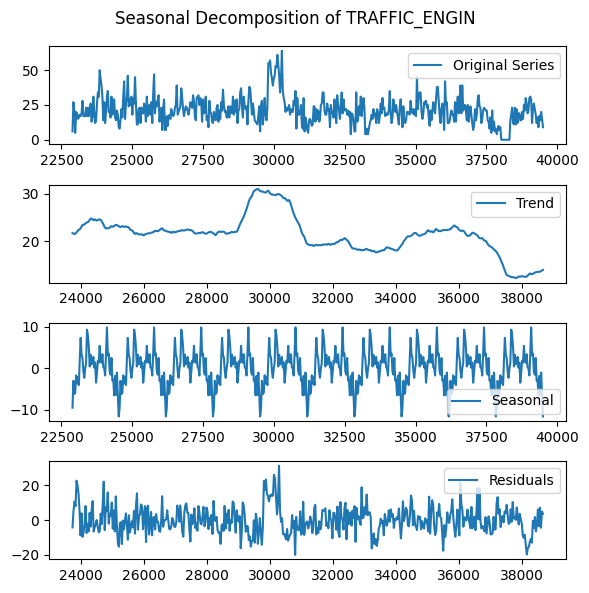

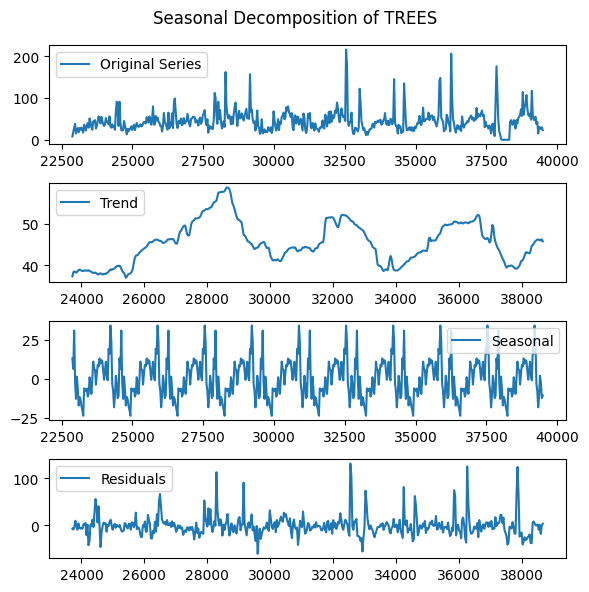

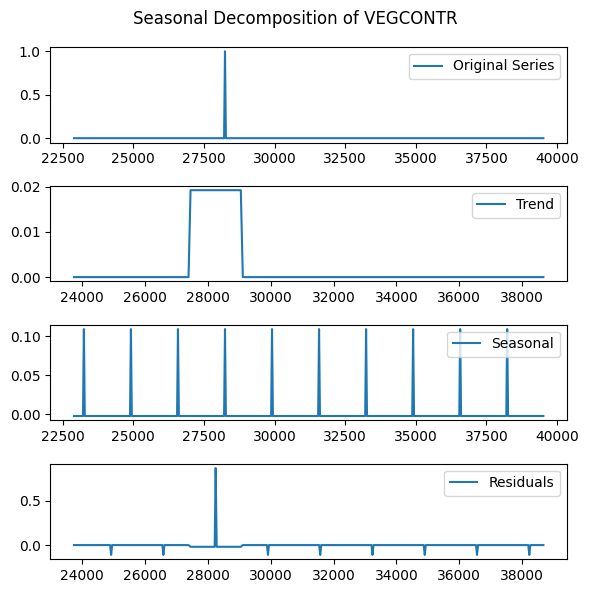

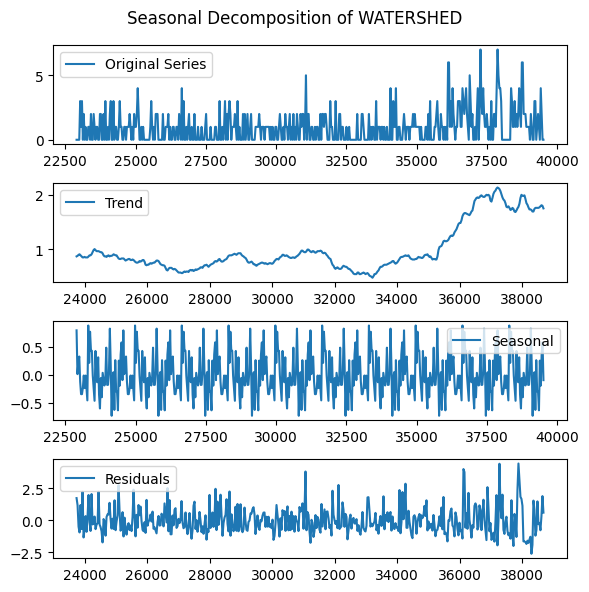

In [36]:
oak = merged_df[merged_df['city'] == 'Oakland']
for dept, df in oak.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [37]:
oak.groupby('department')['count'].median().sort_values()

department
ABANDONED AUTO      0.0
SURVEY              0.0
SIDESHOWS           0.0
CW_DIT_GIS          0.0
POLICE              0.0
VEGCONTR            0.0
ENVIRON_ENF         0.0
FACILITIES          0.0
LAB                 0.0
HOMELESS EMT        0.0
HE_CLEAN            0.0
WATERSHED           1.0
CUT_CLEAN           3.5
KOCB                8.0
FIRE                9.0
DRAINAGE           12.0
ROW                13.0
ROW_INSPECTORS     16.0
TRAFFIC_ENGIN      20.0
SEWERS             20.0
METER_REPAIR       20.0
PARKS              23.0
PARKING            31.5
TRAFFIC            37.0
ELECTRICAL         38.0
RECYCLING          40.0
TREES              41.0
STREETSW           55.0
GRAFFITI           57.0
BLDGMAINT         103.0
OTHER             126.0
ILLDUMP           505.5
Name: count, dtype: float64

Dropping those with few, infrequent, or only too recent requuests (not much history)

In [38]:
drop_depts = ['ABANDONED AUTO','SIDESHOWS','VEGCONTR','FACILITIES','LAB','SURVEY']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Oakland')&(merged_df['department'].isin(drop_depts))])

### Washington Seasonality Plots by Department


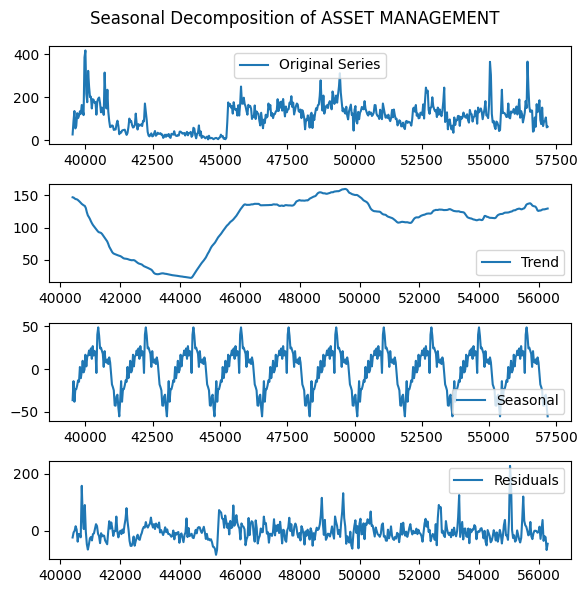

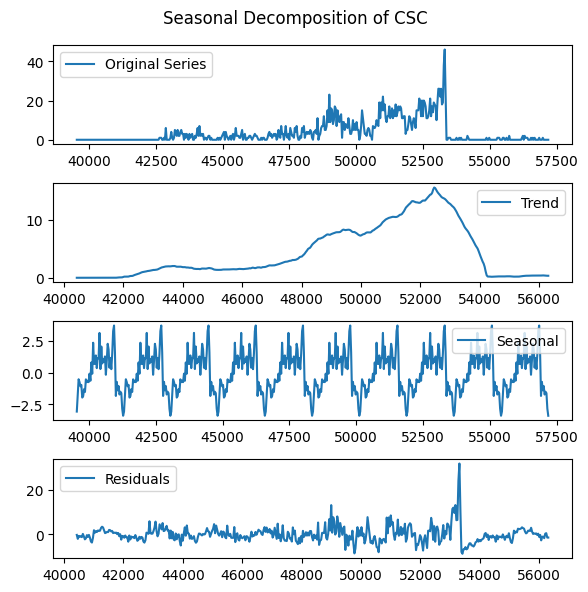

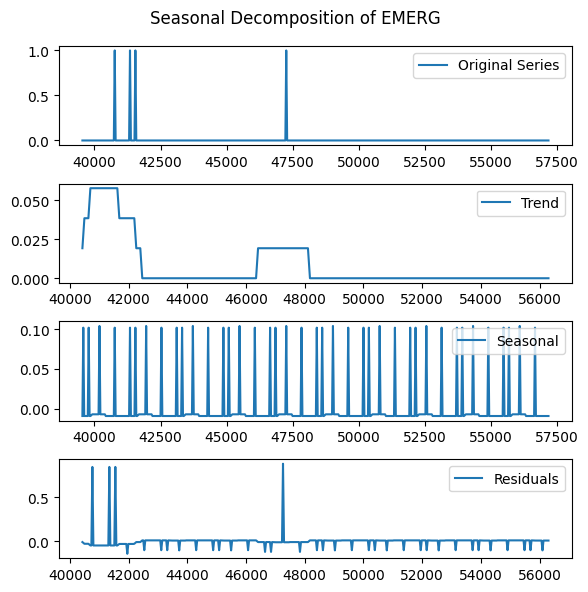

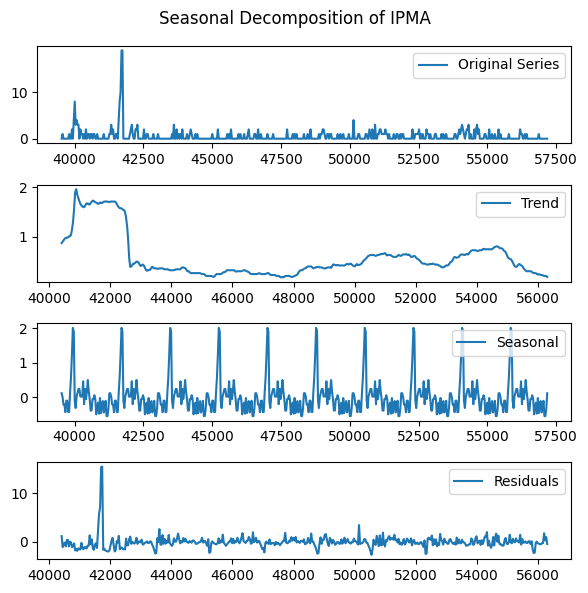

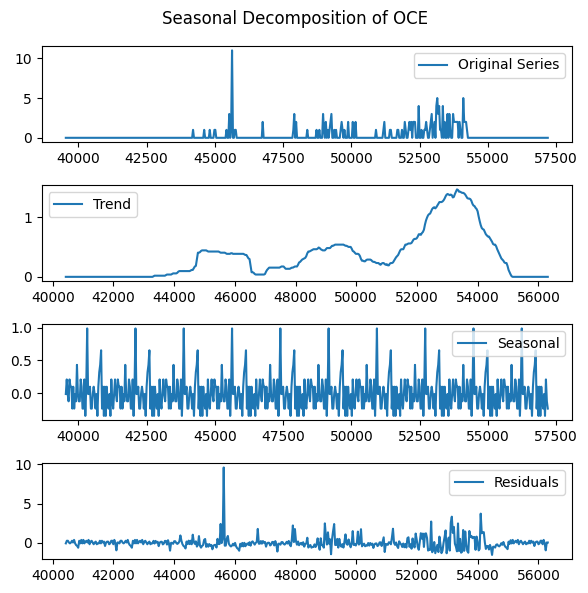

...

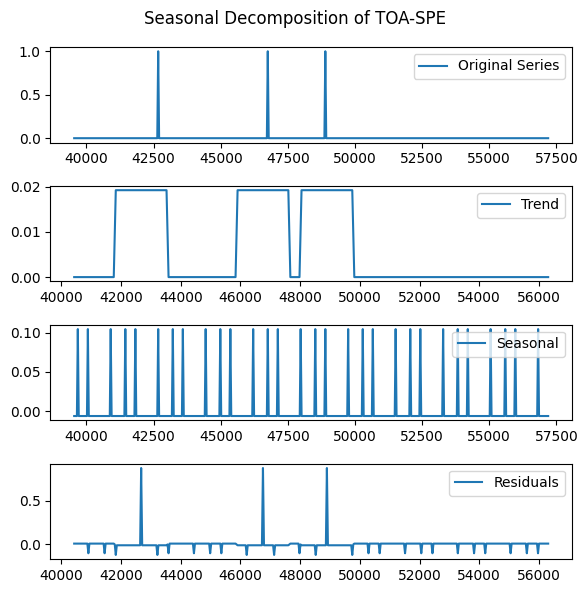

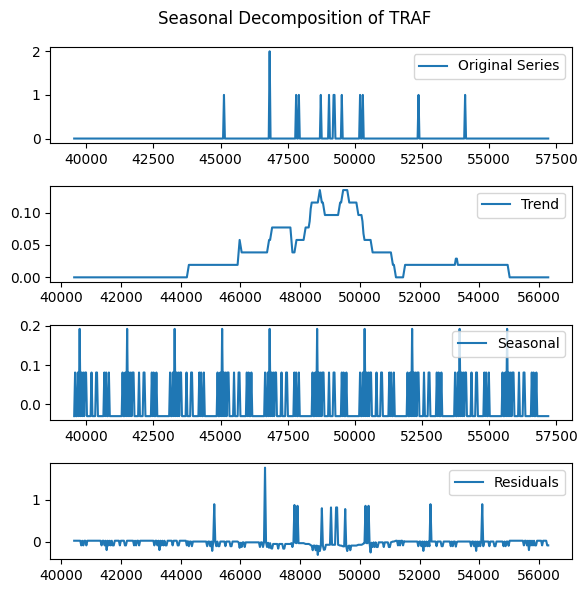

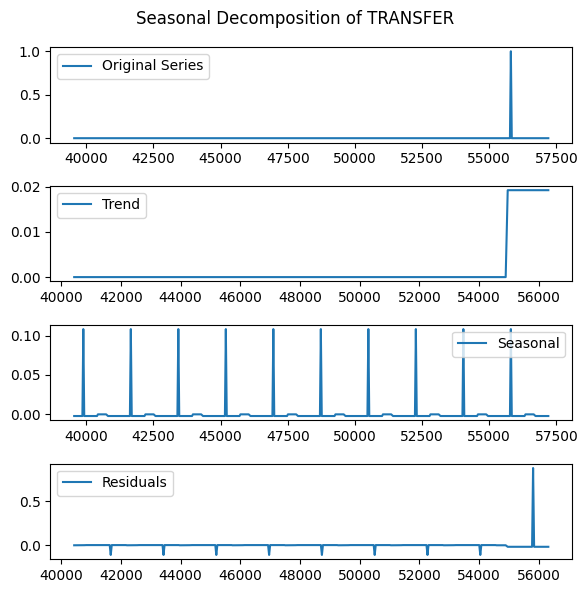

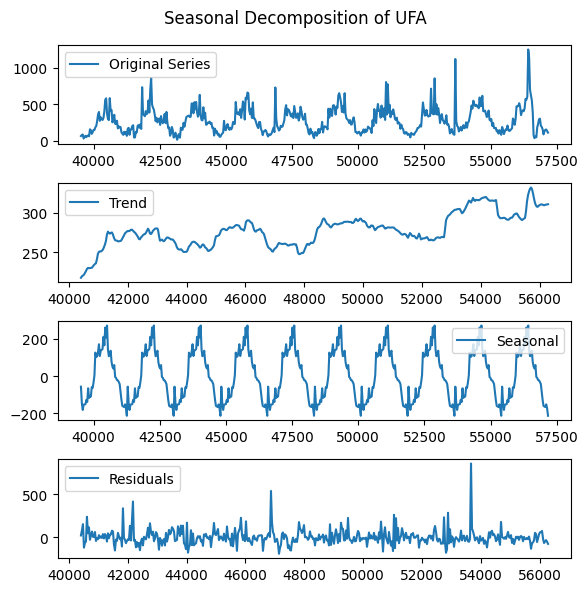

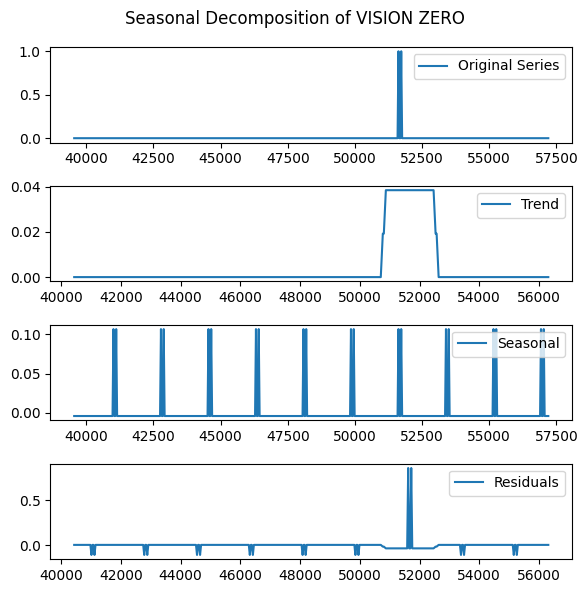

In [39]:
dc = merged_df[merged_df['city'] == 'Washington']
for dept, df in dc.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=52)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


In [40]:
dc.groupby('department')['count'].median().sort_values()

department
VISION ZERO                                 0.0
TOA-SPE                                     0.0
TOA-S                                       0.0
TOA-OOD                                     0.0
TOA-ITS                                     0.0
TRAF                                        0.0
TCO                                         0.0
TRANSFER                                    0.0
STREETCAR                                   0.0
TOA-SIGNALS                                 0.0
PUBLIC SPACE REGULATION ADMINISTRATION      0.0
PUBLIC SPACE INSPECTIONS                    0.0
TOA-SIOD                                    0.0
PSRA                                        0.0
PSMA                                        0.0
PSD                                         0.0
POTHOLES                                    0.0
PD                                          0.0
OCE                                         0.0
IPMA                                        0.0
EMERG                        

In [41]:
drop_depts = ['VISION ZERO','TOA-SPE','TOA-S','TOA-OOD','TRANSFER','PSRA','PSMA','EMERG','PUBLIC SPACE REGULATION ADMINISTRATION','STREETCAR','TOA-ITS','TOA-SIGNALS','TRAF']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Washington')&(merged_df['department'].isin(drop_depts))])

### Conclusion

In [42]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

78 unique combinations of city and department


In [43]:
merged_df.to_csv("../data/out/merged_data_newtix.csv", index=False)